In [17]:
%pip install stardist
%pip install imagecodecs
%pip install numpy
%pip install matplotlib
%pip install csbdeep
%pip install pandas
%pip install seaborn
%pip install tensorflow
%pip install keras


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Zsombi\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


# Importing the .svs files using csbdeep

In [18]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = "retina"

from tifffile import imread, imsave
from csbdeep.utils import Path, normalize
from csbdeep.utils.tf import keras_import
keras = keras_import()

from stardist import export_imagej_rois, random_label_cmap
from stardist.models import StarDist2D

np.random.seed(0)
cmap = random_label_cmap()


In [19]:
def show_image(img, **kwargs):
    fig, ax = plt.subplots(2,4, figsize=(16,8))
    mid = [s//2+600 for s in img.shape[:2]]
    for a,t,u in zip(ax.ravel(),[1,2,4,8,16,32,64,128],[16,8,4,2,1,1,1,1]):
        sl = tuple(slice(c-s//t//2, c+s//t//2, u) for s,c in zip(img.shape[:2], mid))
        a.imshow(img[sl], **kwargs)
        a.axis('off')
    plt.tight_layout()
    plt.show()

In [20]:
img = imread('C:/Users/Zsombi/Downloads/PKG - Biobank_CMB-CRC_v3/CMB-CRC/MSB-08631-04-02.svs')

In [21]:
img.shape

(57890, 61751, 3)

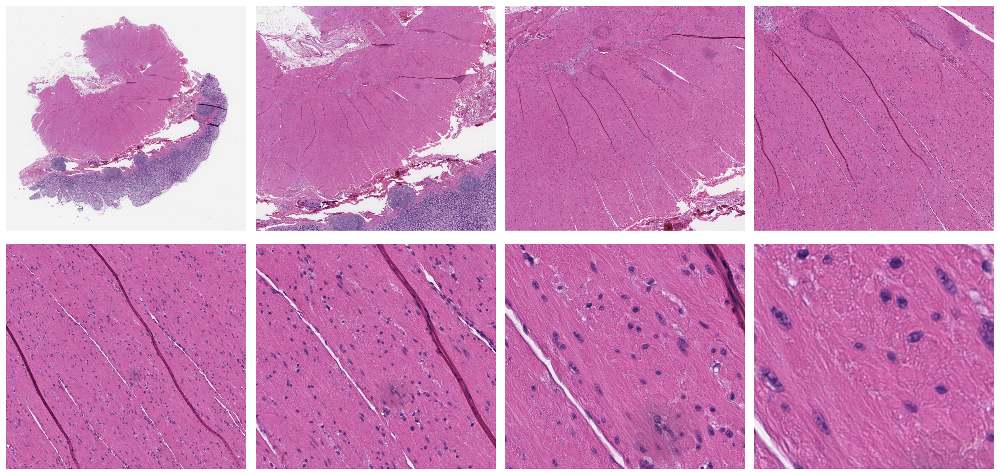

In [22]:
show_image(img)

# Segmentation using StarDist2D pre trained model for baseline

https://stardist.net

https://github.com/stardist/stardist/

In [23]:
model = StarDist2D.from_pretrained("2D_versatile_he")

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [24]:
from csbdeep.data import Normalizer, normalize_mi_ma

class Scale_Norm(Normalizer):
    def __init__(self, mi, ma):
        self.mi, self.ma = mi, ma
    def before(self, x, axes):
        return normalize_mi_ma(x, self.mi, self.ma, dtype=np.float32)
    def after(*args, **kwargs):
        assert False
    @property
    def do_after(self):
        return False
    


mi, ma = 0, 255
normalizer = Scale_Norm(mi,ma)

In [27]:
labels, palys = model.predict_instances_big(img, axes='YXC', block_size=4096, min_overlap=128, context=128, normalizer=normalizer, n_tiles=(4,4,1))

effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


MemoryError: Unable to allocate 13.3 GiB for an array with shape (57890, 61751) and data type int32

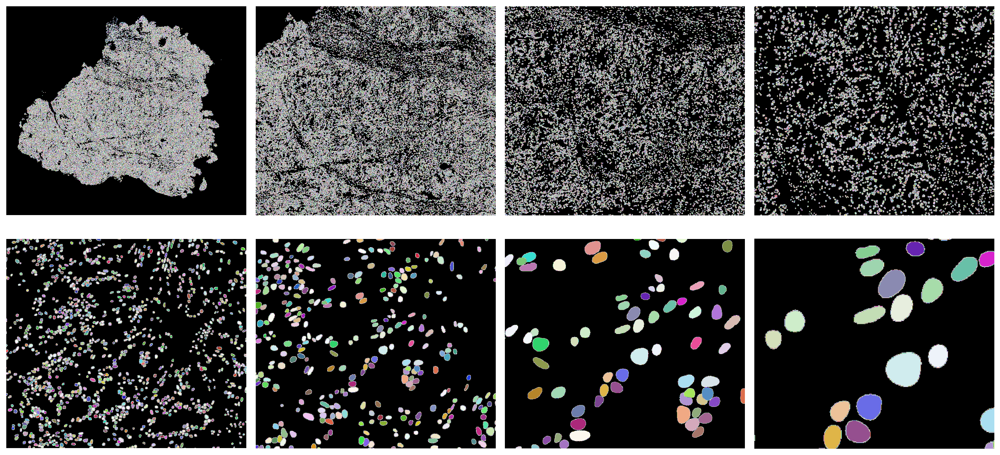

In [ ]:
show_image(labels,cmap=cmap)

In [ ]:
from skimage.measure import regionprops_table
import pandas as pd

props = regionprops_table(labels, img, properties=["label", "area", "equivalent_diameter", "mean_intensity", "solidity"])

In [ ]:
analysis_res = pd.DataFrame(props)
print(analysis_res.tail())

         label    area  equivalent_diameter  mean_intensity-0  \
151539  151540   276.0            18.746043         51.300725   
151540  151541   683.0            29.489364         78.645681   
151541  151542   548.0            26.414679         59.653285   
151542  151543  1254.0            39.958008        104.177033   
151543  151544   651.0            28.790258         98.416283   

        mean_intensity-1  mean_intensity-2  solidity  
151539         38.148551         90.373188  0.926174  
151540         41.366032        104.311859  0.953911  
151541         28.419708         78.321168  0.958042  
151542         52.216108        116.326156  0.973602  
151543         57.082949        124.081413  0.965875  


<Axes: xlabel='area', ylabel='Count'>

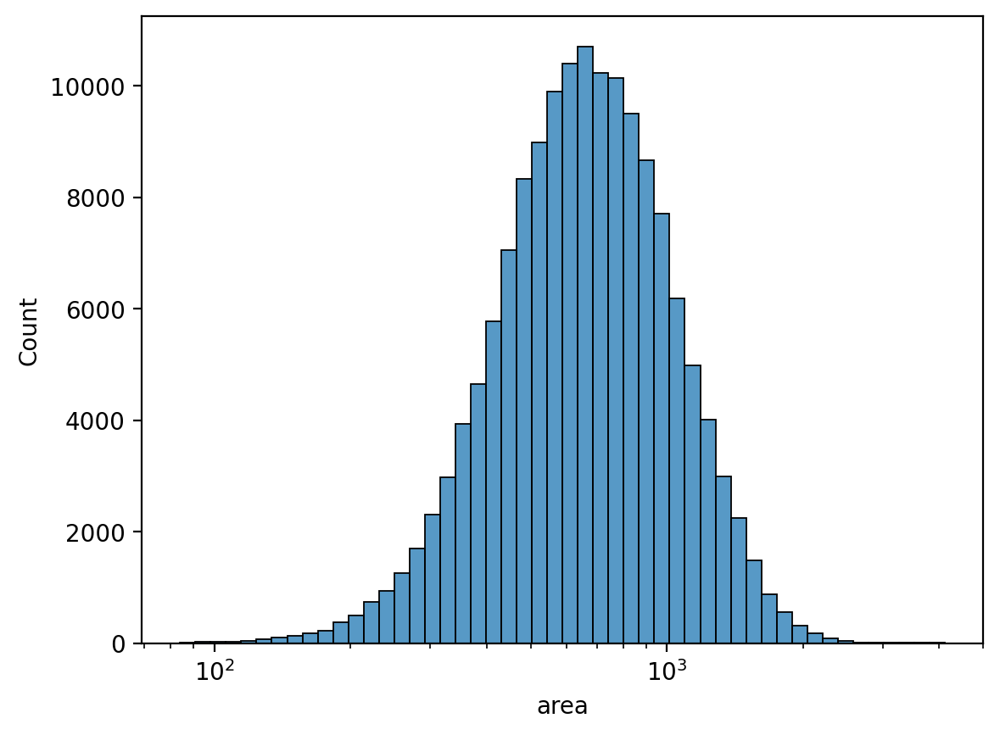

In [ ]:
import seaborn as sns

sns.histplot(x="area", data=analysis_res, bins=50, log_scale=True)

In [ ]:
imsave("masks/MSB-08631-04-02.tif", labels)

2064373923.py (1): <tifffile.imsave> is deprecated. Use tifffile.imwrite
